Machine Learning Assignemnt 1

Constantin von Krogh 13986767

Antoni Wonnka 14001128

In [4]:
!pip install mglearn
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from numpy.ma.core import masked_not_equal
from google.colab import drive
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LassoCV, ElasticNet
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_val_score
from sklearn.svm import SVC
#from sklearn import datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 581.4/581.4 kB 7.8 MB/s eta 0:00:00


**Part 1**

We load the datasets and convert the features
into mostly floats and the qualtiy as a int, this choice is based on the dataset describtion and the data itself.

In [5]:
desc = {"volatile acidity":float, "fixed acidity":float, "citric acid":float,
        "residual sugar": float, "chlorides": float, "total sulfur dioxide": float,
        "free sulfur dioxide": float, "density": float, "pH": float,
        "sulphates": float, "alcohol": float, "quality": int}

drive.mount('/content/drive', force_remount=True)
red = pd.read_csv("drive/MyDrive/Colab Notebooks/Machine Learning/Assignment 1/winequality-red.csv", sep=';', dtype=desc
                    )
white = pd.read_csv("drive/MyDrive/Colab Notebooks/Machine Learning/Assignment 1/winequality-white.csv", sep=';',dtype = desc)

Mounted at /content/drive


**Analysis of the data**

In [6]:
white.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


In [7]:
red.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [8]:
red.info()

white.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column        

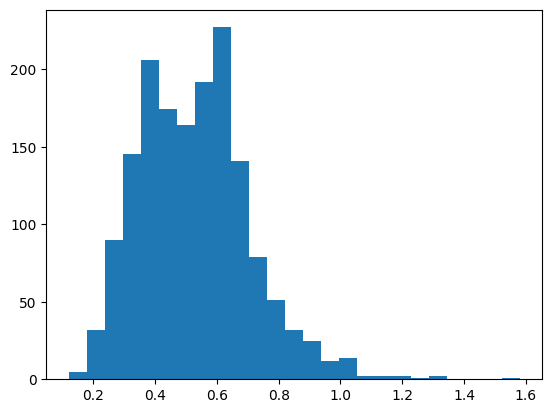

Not an outlier if in range [0.015, 1.015]


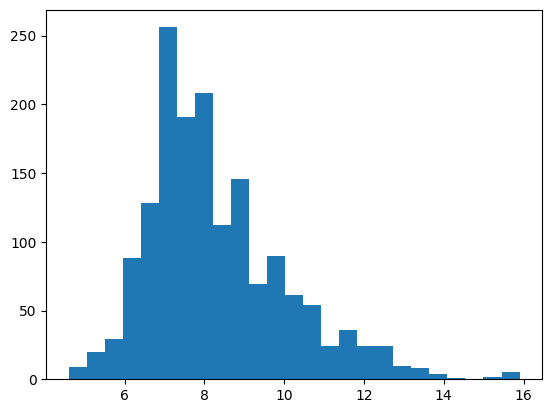

Not an outlier if in range [3.950, 12.350]


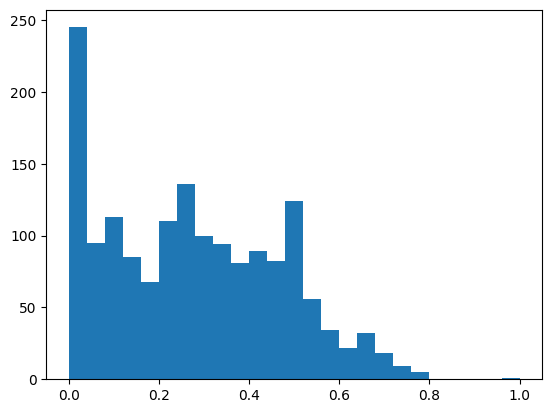

Not an outlier if in range [-0.405, 0.915]


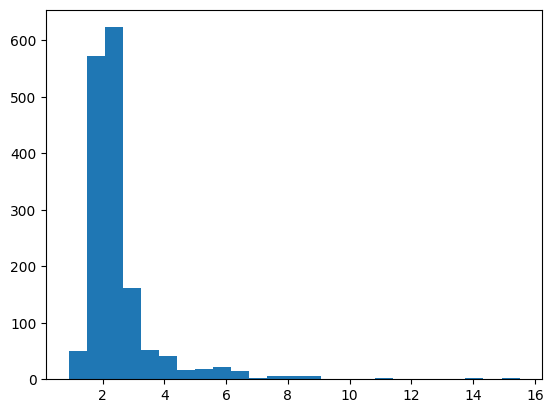

Not an outlier if in range [0.850, 3.650]


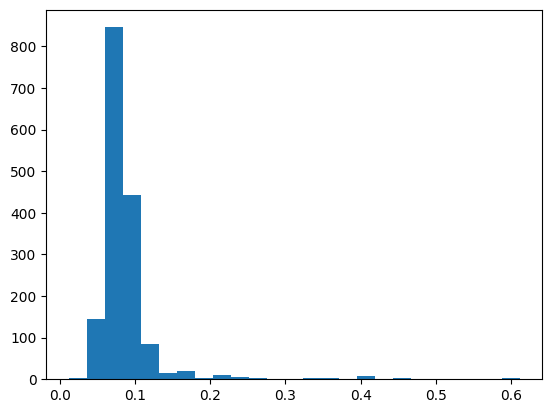

Not an outlier if in range [0.040, 0.120]


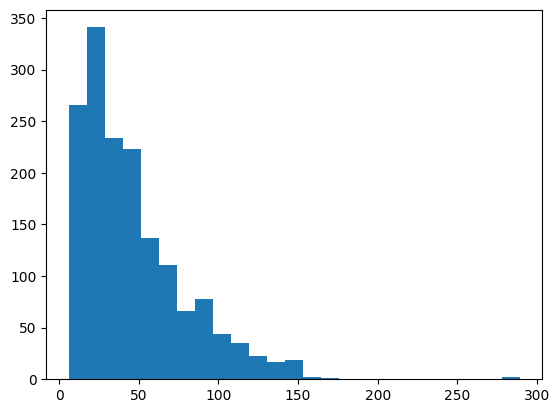

Not an outlier if in range [-38.000, 122.000]


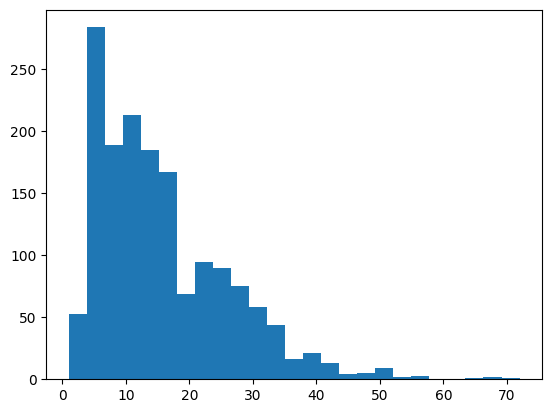

Not an outlier if in range [-14.000, 42.000]


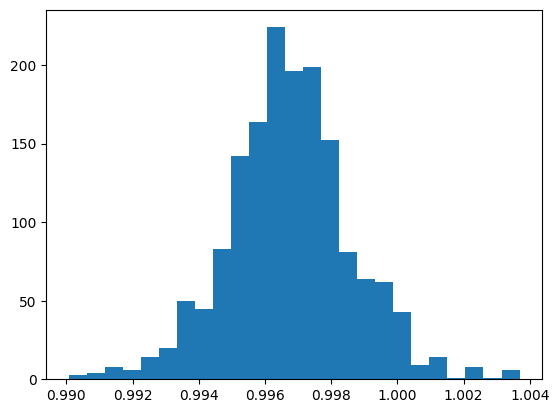

Not an outlier if in range [0.992, 1.001]


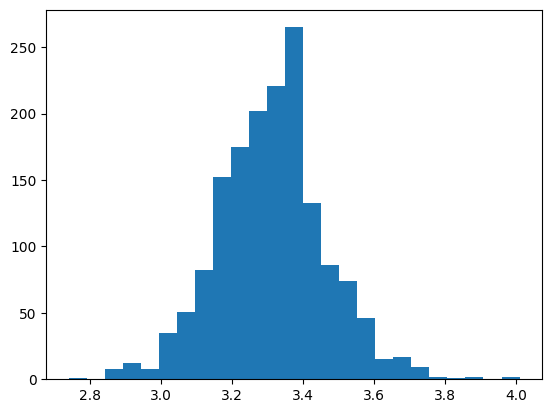

Not an outlier if in range [2.925, 3.685]


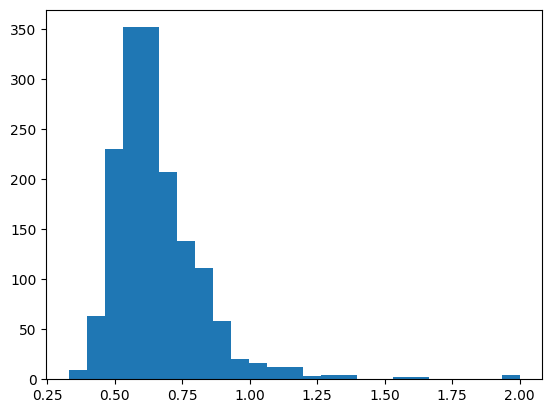

Not an outlier if in range [0.280, 1.000]


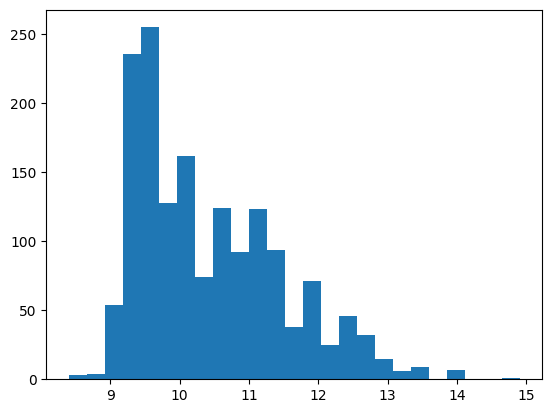

Not an outlier if in range [7.100, 13.500]


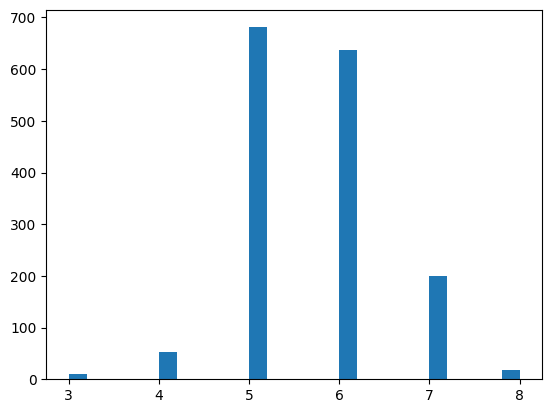

Not an outlier if in range [3.500, 7.500]


In [9]:
for col in desc:
  plt.hist(red[col],bins = 25)
  plt.show()
  outlier_low = red[col].quantile(.25) - 1.5 * (red[col].quantile(.75) - red[col].quantile(.25))
  outlier_high = red[col].quantile(.75) + 1.5 * (red[col].quantile(.75) - red[col].quantile(.25))
  print(f"Not an outlier if in range [{outlier_low:.3f}, {outlier_high:.3f}]")

**1.1**
Converting into an appropriate data type

In [10]:
def normalize(dataset):
    dataNorm=((dataset-dataset.min())/(dataset.max()-dataset.min()))
    dataNorm[col]=dataset[col]
    return dataNorm
n_red=normalize(red)
n_white=normalize(white)

**1.2**

Demonstration of the distribtion of the features:

First we use a Boxplot


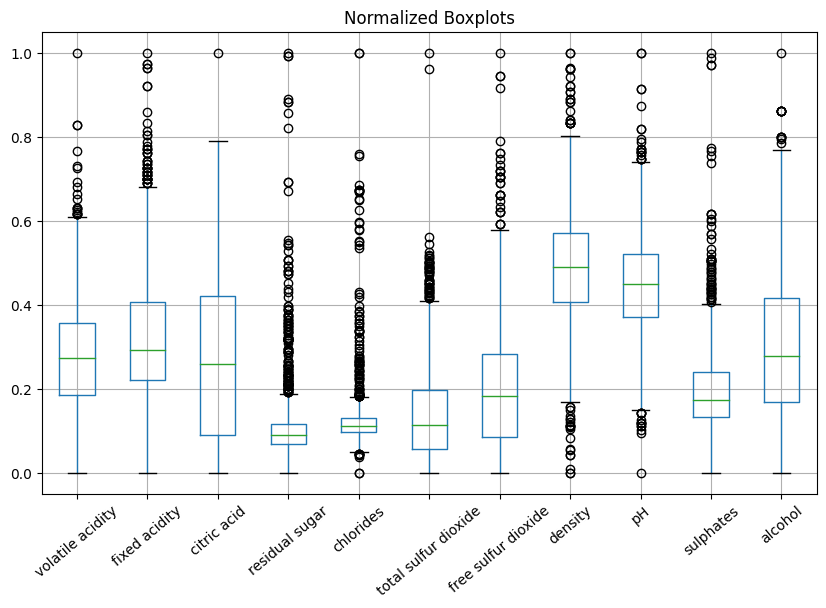

In [11]:
bp1 = n_red.boxplot(column=['volatile acidity','fixed acidity','citric acid',
                             'residual sugar','chlorides','total sulfur dioxide',
                             'free sulfur dioxide','density','pH','sulphates','alcohol'], figsize= (10,6),rot = 40).set(title="Normalized Boxplots")

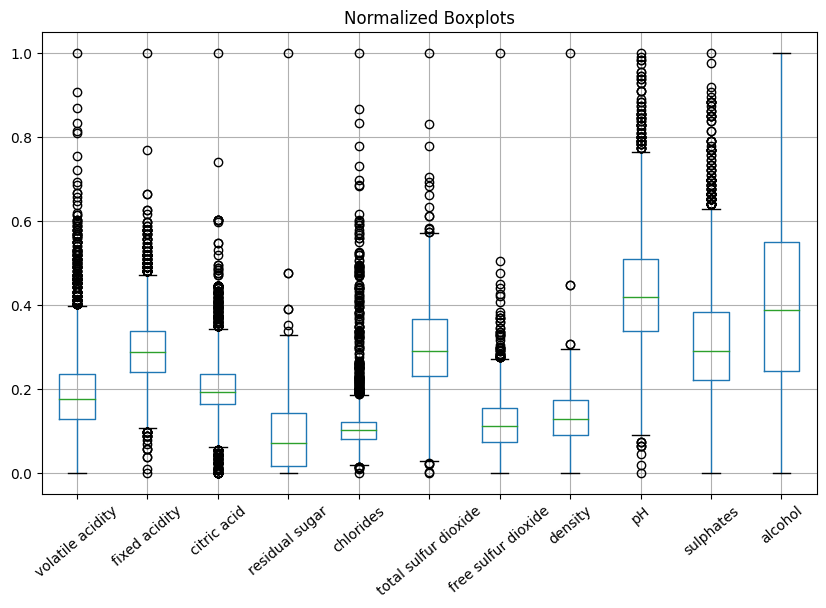

In [12]:
bp1 = n_white.boxplot(column=['volatile acidity','fixed acidity','citric acid',
                             'residual sugar','chlorides','total sulfur dioxide',
                             'free sulfur dioxide','density','pH','sulphates','alcohol'], figsize= (10,6),rot = 40).set(title="Normalized Boxplots")

Correlation check between features:

<Figure size 3000x1500 with 0 Axes>

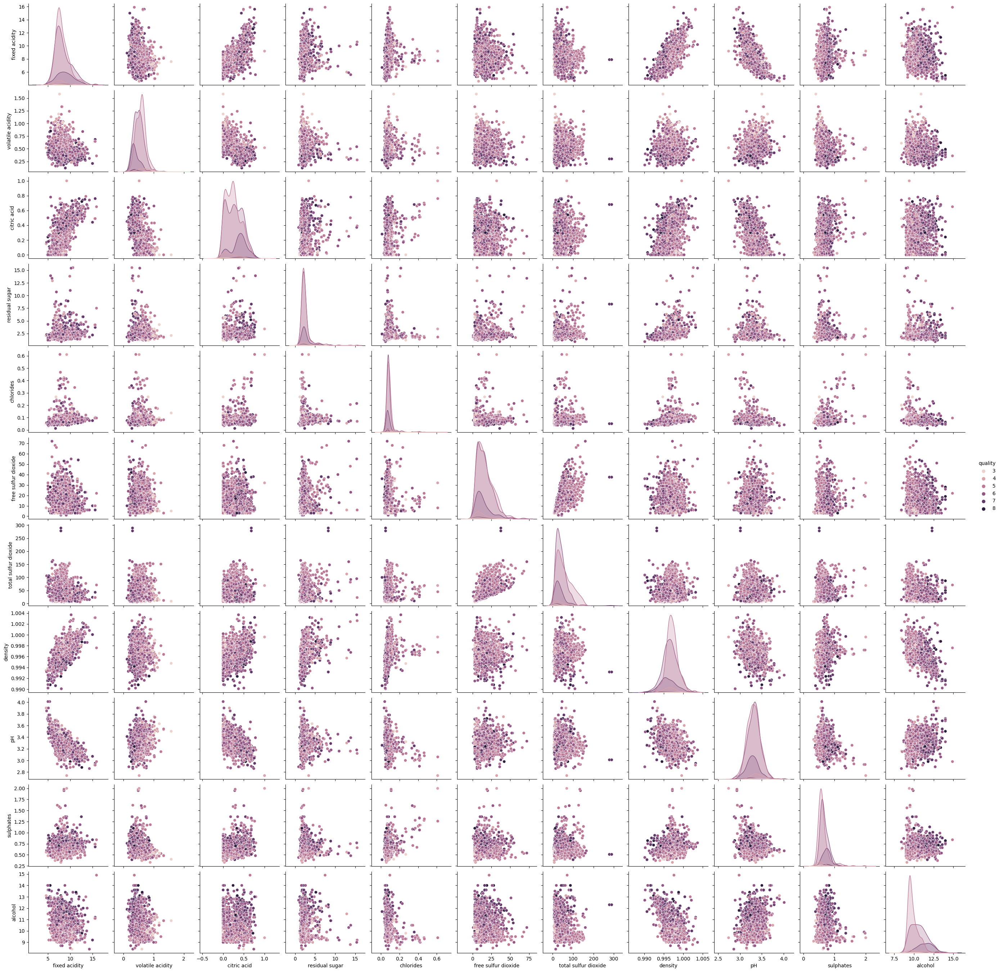

In [13]:
plt.figure(figsize=(30,15))
sns.pairplot(data=red, hue='quality')
plt.show()

<Figure size 3000x1500 with 0 Axes>

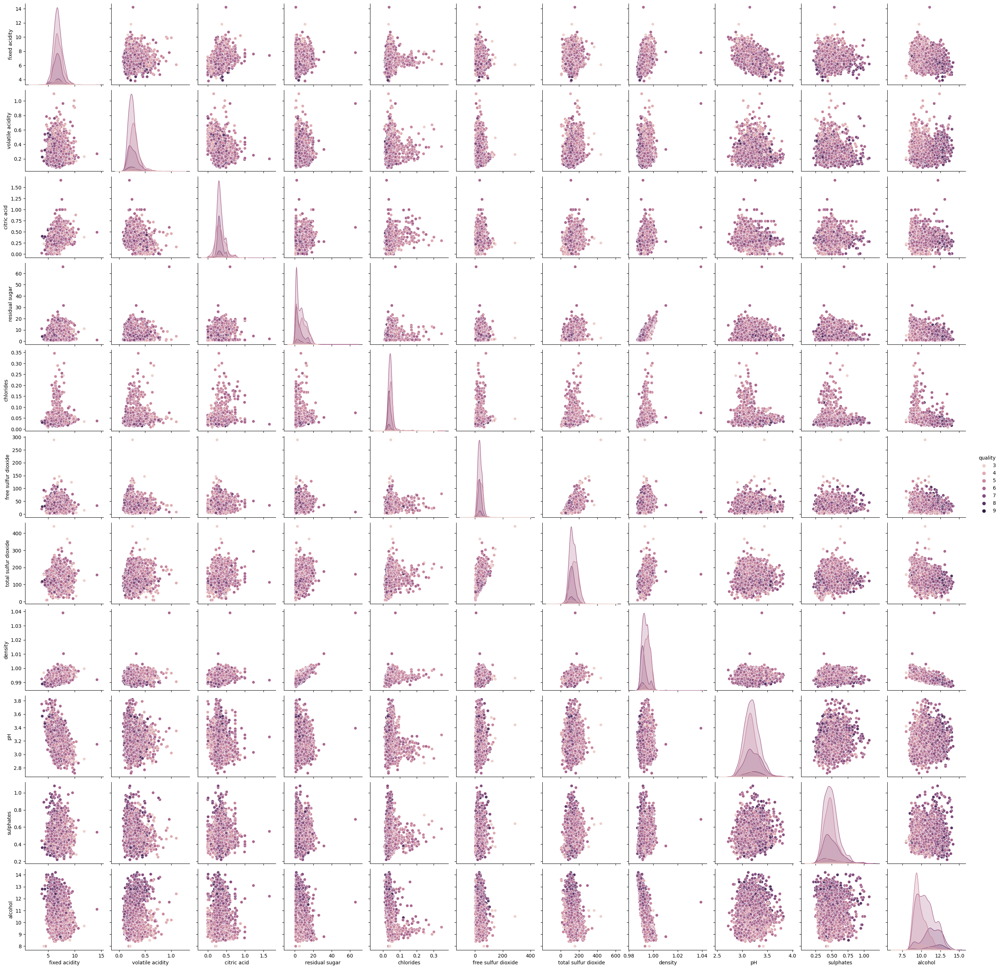

In [14]:
plt.figure(figsize=(30,15))
custom_palette = 'viridis'
sns.pairplot(data=white, hue='quality')
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

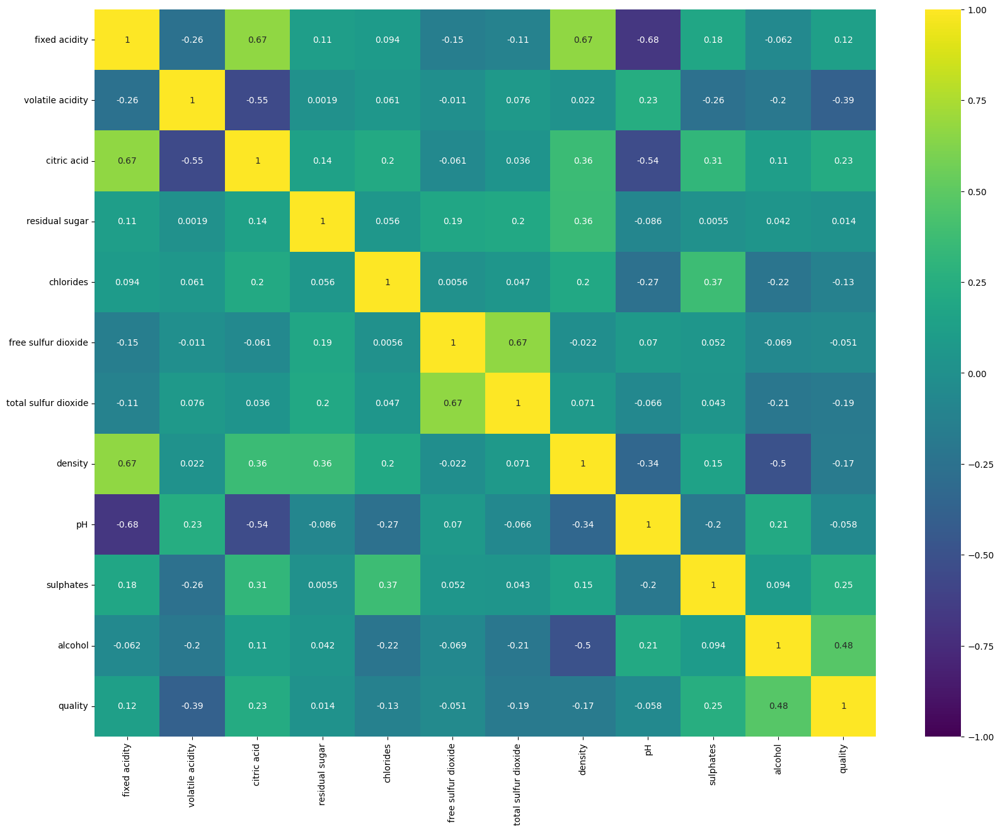

In [15]:
plt.figure(figsize=(20,15))
sns.heatmap(red.corr(), vmin=-1, vmax=1, cmap="viridis", annot= True)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

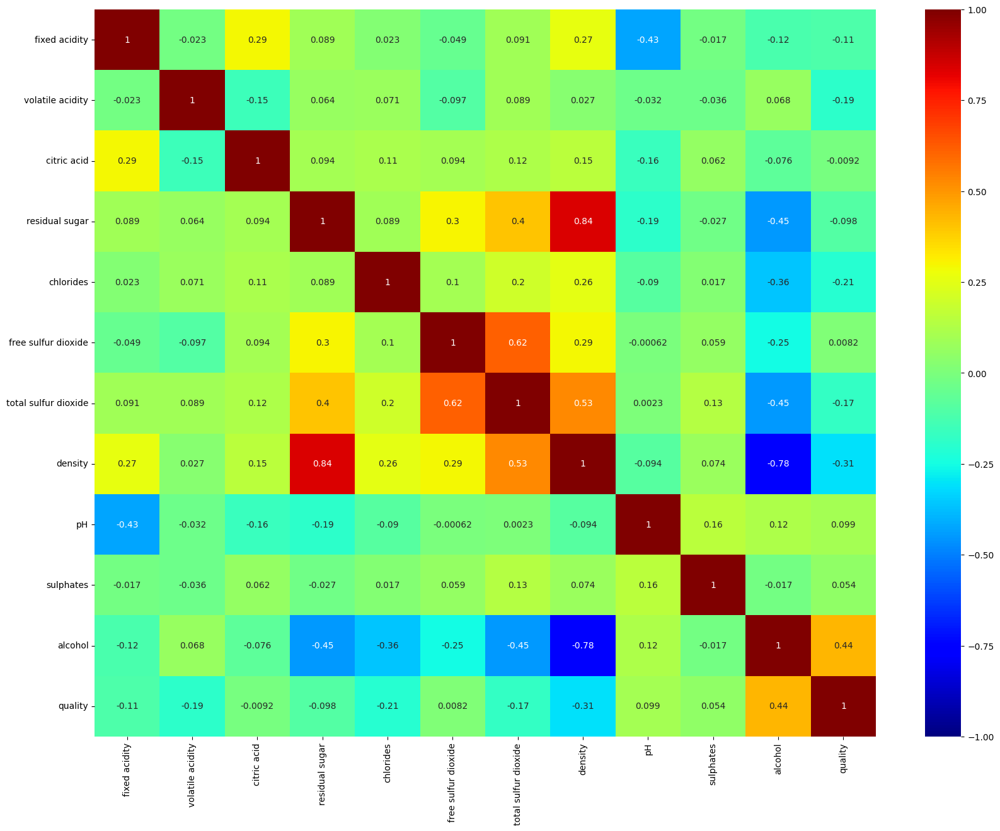

In [16]:
plt.figure(figsize=(20,15))
sns.heatmap(white.corr(), vmin=-1, vmax=1, cmap="jet", annot= True)
plt.show

**Findings**:

From the plots above, we see that the highest to the lowest correlation in order to Quality are: Alcohol (0.48), Volatile Acidity (-0.39), Sulphates (0.25), Citric Acid (0.23), Total Sulfur Dioxide (-0.19), Density (-0.17), Chlorides (-0.13), Fixed Acidity (0.12), pH (-0.058), Free Sulfur Dioxide (-0.051), and Residual Sugar (0.014)

**Part 2**

OLS

Red Wine
The MSE for training set is 0.652797804315173
The MSE for test set is 0.6330721652189467
The MAE for training set is 0.7149837364677113
The MAE for test set is 0.6979442789071919
The R squared value for training set is 0.37096437294057627
The R squared value for test set is 0.32071124343219437
Intercept is 21.011050088278818
The set of coefficients are [-1.21385635e+00  2.02362546e-02 -9.84560496e-02  2.21024824e-02
 -1.89761853e+00 -3.00386885e-03  1.99433159e-03 -1.67249074e+01
 -3.97705407e-01  8.54179475e-01  2.67506351e-01]
Training set score: 0.37
Test set score: 0.32


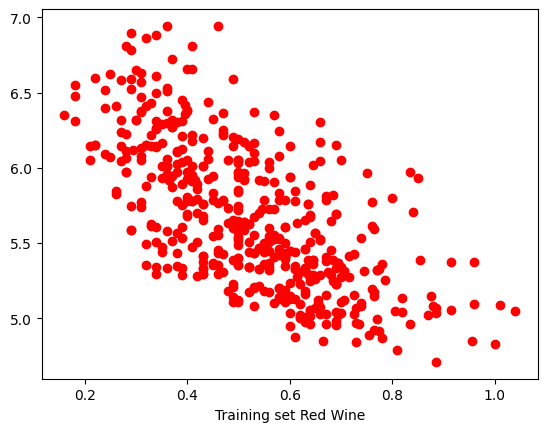

In [42]:
X = red[["volatile acidity", "fixed acidity", "citric acid",
        "residual sugar", "chlorides", "total sulfur dioxide",
        "free sulfur dioxide" ,"density","pH",
        "sulphates", "alcohol"]]

Y = red['quality']


X_train,X_test,Y_train, Y_test = train_test_split(X,Y,
                                              random_state = 0,
                                              test_size = 0.3)
lr= LinearRegression().fit(X_train,Y_train)
pred_train_lr= lr.predict(X_train)
pred_test_lr= lr.predict(X_test)


mse_tr = np.sqrt(mean_squared_error(Y_train,pred_train_lr))
mse_te = np.sqrt(mean_squared_error(Y_test,pred_test_lr))
r2 = r2_score(Y_test, pred_test_lr)
mae_tr = np.sqrt(mean_absolute_error(Y_train,pred_train_lr))
mae_te = np.sqrt(mean_absolute_error(Y_test,pred_test_lr))

OLS = LinearRegression()
OLS.fit(X_train,Y_train)
y_train_pred1 = OLS.predict(X_test)
plt.scatter(X_test.iloc[:,0].values, y_train_pred1, color='r')
plt.xlabel("Training set Red Wine")


print("Red Wine")
print("The MSE for training set is " + str(mse_tr))
print("The MSE for test set is " + str(mse_te))
print("The MAE for training set is " + str(mae_tr))
print("The MAE for test set is " + str(mae_te))
print("The R squared value for training set is " + str(OLS.score(X_train,Y_train)))
print("The R squared value for test set is " + str(r2))
print("Intercept is " + str(OLS.intercept_))
print("The set of coefficients are " + str(OLS.coef_))
print("Training set score: {:.2f}".format(lr.score(X_train,Y_train)))
print("Test set score: {:.2f}".format(lr.score(X_test,Y_test)))

White Wine
The MSE for training set is 0.7393237523677045
The MSE for test set is 0.7797679548206522
The MAE for training set is 0.7576296453636201
The MAE for test set is 0.7800652044451112
The R squared value for training set is 0.29235428410653197
The R squared value for test set is 0.24815662587559573
Intercept is 200.28325185618593
The set of coefficients are [-1.80466188e+00  1.15989956e-01 -1.50084077e-02  9.67717990e-02
 -4.22336380e-01 -2.40509546e-04  5.11799045e-03 -2.01070812e+02
  8.69262672e-01  6.58085048e-01  1.28438281e-01]
Training set score: 0.29
Test set score: 0.25


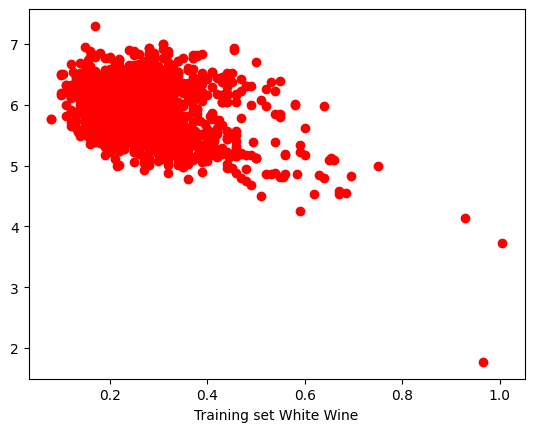

In [40]:
X = white[["volatile acidity", "fixed acidity", "citric acid",
        "residual sugar", "chlorides", "total sulfur dioxide",
        "free sulfur dioxide" ,"density","pH",
        "sulphates", "alcohol"]]
Y = white['quality']


X_train,X_test,Y_train, Y_test = train_test_split(X,Y,
                                                    random_state = 0,
                                                 test_size = 0.3)
lr= LinearRegression().fit(X_train,Y_train)
OLS = LinearRegression()
OLS.fit(X_train,Y_train)
pred_train_lr= lr.predict(X_train)
pred_test_lr= lr.predict(X_test)

mse_tr = np.sqrt(mean_squared_error(Y_train,pred_train_lr))
mse_te = np.sqrt(mean_squared_error(Y_test,pred_test_lr))
mae_tr = np.sqrt(mean_absolute_error(Y_train,pred_train_lr))
mae_te = np.sqrt(mean_absolute_error(Y_test,pred_test_lr))
r2 = r2_score(Y_test, pred_test_lr)

y_train_pred1 = OLS.predict(X_test)
plt.scatter(X_test.iloc[:,0].values, y_train_pred1, color='r')
plt.xlabel("Training set White Wine")

print("White Wine")
print("The MSE for training set is " + str(mse_tr))
print("The MSE for test set is " + str(mse_te))
print("The MAE for training set is " + str(mae_tr))
print("The MAE for test set is " + str(mae_te))
print("The R squared value for training set is " + str(OLS.score(X_train,Y_train)))
print("The R squared value for test set is " + str(r2))
print("Intercept is " + str(OLS.intercept_))
print("The set of coefficients are " + str(OLS.coef_))
print("Training set score: {:.2f}".format(lr.score(X_train,Y_train)))
print("Test set score: {:.2f}".format(lr.score(X_test,Y_test)))

**2.2**


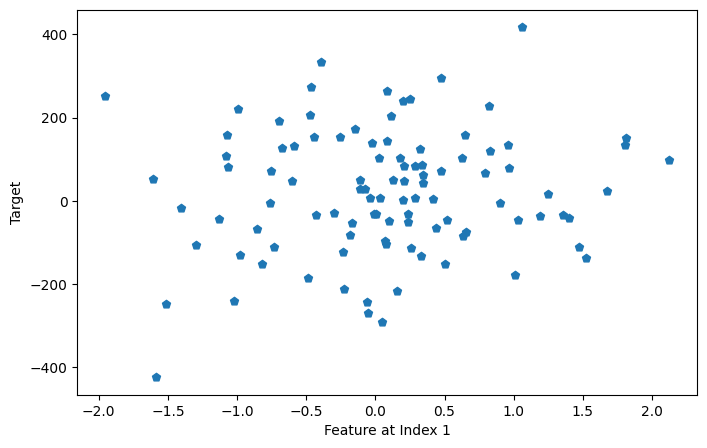

Intercept: -5.329070518200751e-15
Coefficients: [45.473985563385924, -7.105427357601002e-15, 30.792994159119075, 48.884658025692005, 2.997358987267787, 66.68642575461044, 67.3432433324918, 70.4680762736647, 51.559602857925015, 13.965125475631286, 20.18534521229485]


In [48]:
X, y = make_regression(
    n_samples=100,
    n_features=11,
    random_state=42
    )
plt.subplots(figsize=(8, 5))
plt.scatter(X[:, 1], y, marker='p')
plt.xlabel("Feature at Index 1")
plt.ylabel("Target")
plt.show()

Xp = np.concatenate([np.ones((len(X), 1)), X], axis=1)
theta_best = np.linalg.inv(Xp.T.dot(Xp)).dot(Xp.T).dot(y)
intercept, *coef = theta_best
print(f"Intercept: {intercept}\n\
Coefficients: {coef}")

**Potential shortcomings:**

In summary, while closed-form solutions have their advantages in simplicity and elegance, they are not universally applicable. The choice between closed-form and iterative/numerical methods depends on the nature of the problem, the available computational resources, and the specific requirements of the application.

**Part 3**

Ride Regression Red Wine





In [45]:
n_samples, n_features = 10, 5
X = red[["volatile acidity", "fixed acidity", "citric acid",
        "residual sugar", "chlorides", "total sulfur dioxide",
        "free sulfur dioxide" ,"density","pH",
        "sulphates", "alcohol"]]
y = red['quality']

X_train,X_test,Y_train, Y_test = train_test_split(X,y,
                                              random_state = 0)

model_ridge = Ridge(alpha=1.0)
model_ridge.fit(X_train, Y_train)
pred_train_rr= model_ridge.predict(X_train)
pred_test_rr= model_ridge.predict(X_test)

print("MSE " + str(np.sqrt(mean_squared_error(Y_train,pred_train_rr))))
print("MAE " + str(mean_absolute_error(Y_train, pred_train_rr)))
print("R^2 Train "+ str(r2_score(Y_train, pred_train_rr)))
print("R^2 Test "+ str(r2_score(Y_test, pred_test_rr)))

MSE 0.6515178532725543
MAE 0.5106439369703604
R^2 Train 0.3618266923563306
R^2 Test 0.3448153822159903


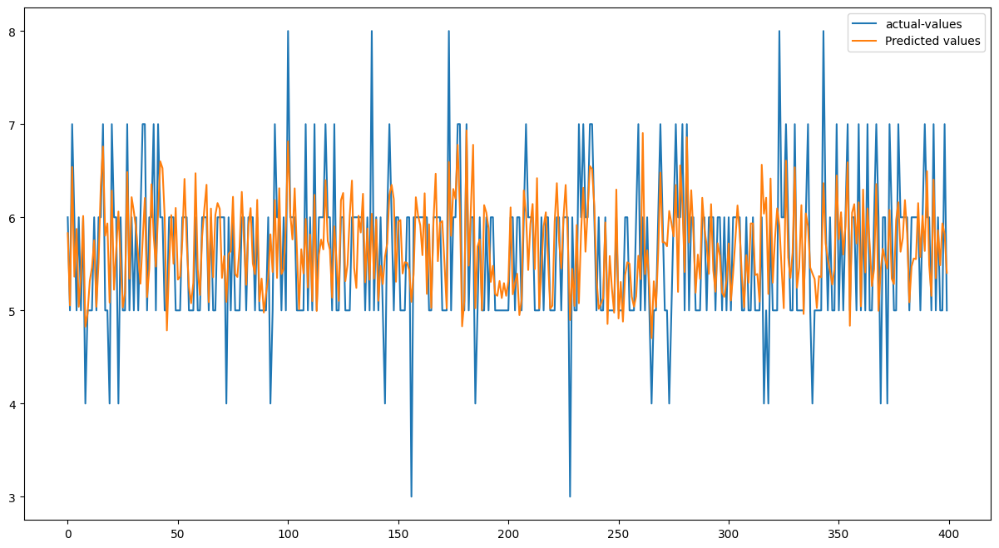

In [19]:
plt.figure(figsize=(15, 8))
plt.plot([i for i in range(len(Y_test))],Y_test, label="actual-values")
plt.plot([i for i in range(len(Y_test))],pred_test_rr, label="Predicted values")
plt.legend()
plt.show()

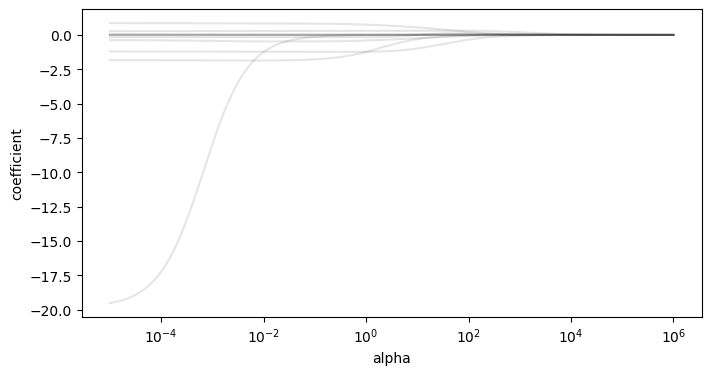

In [20]:
n_alphas = 200
alphas = np.logspace(-5, 6, n_alphas)
plt.figure(figsize=(8, 4))
coefs = []
for a in alphas:
    ridge = Ridge(alpha=a)
    ridge.fit(X_train, Y_train)
    coefs.append(ridge.coef_)

plt.plot(alphas, coefs, c='k', alpha=.1)
plt.xscale("log")
plt.xlabel("alpha")
plt.ylabel("coefficient")
plt.ylim=([-5,5])
plt.show()

Text(0, 0.5, 'R^2')

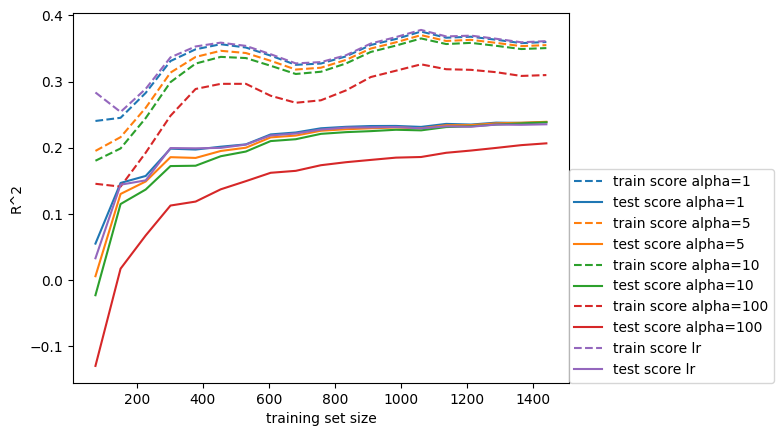

In [21]:
from sklearn.model_selection import learning_curve
def plot_learning_curve(est, name):
    train_set_size, train_scores, test_scores = learning_curve(est, X, y, cv=10, train_sizes=np.linspace(0, 1, 20)[1:])
    test_mean = test_scores.mean(axis=1)
    train_mean = train_scores.mean(axis=1)
    line, = plt.plot(train_set_size, train_mean, linestyle="--", label="train score {}".format(name))
    plt.plot(train_set_size, test_mean, label="test score {}".format(name),
             c=line.get_color())

plot_learning_curve(Ridge(alpha=1), "alpha=1")
plot_learning_curve(Ridge(alpha=5), "alpha=5")
plot_learning_curve(Ridge(alpha=10), "alpha=10")
plot_learning_curve(Ridge(alpha=100), "alpha=100")
plot_learning_curve(LinearRegression(), "lr")
plt.legend(loc=(1, 0))
plt.xlabel("training set size")
plt.ylabel("R^2")

Grid search


In [22]:
ridge = Ridge()
parameters = {'alpha':[1e-15,1e-10,1e-8,1e-3,1e-2,1e-1,0.1]}
ridge_regressor = GridSearchCV(ridge,parameters)
ridge_regressor.fit(X_train,Y_train)

print("GridSearchCV on training set")
print(ridge_regressor.best_params_)
print(ridge_regressor.best_score_)

GridSearchCV on training set
{'alpha': 0.1}
0.3317367203956663


MSE 0.6509688613847453
MAE 0.5099819463416139
R^2|Train 0.3629017338389232
R^2|Test 0.3451884877134057


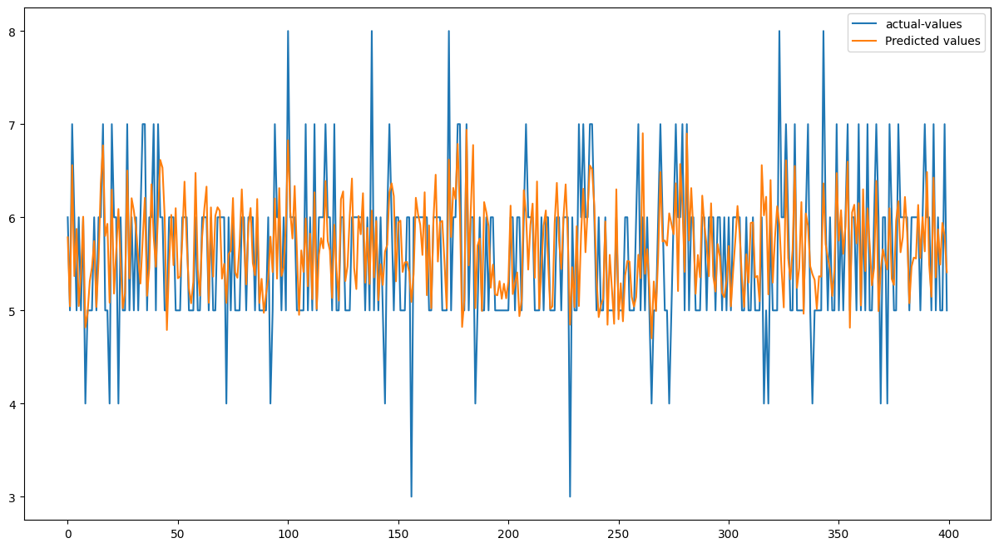

In [23]:
model_ridge1 = Ridge(alpha = 0.1)
model_ridge1.fit(X_train, Y_train)

pred_train_rrr= model_ridge1.predict(X_train)
pred_test_rrr= model_ridge1.predict(X_test)
print("MSE " + str(np.sqrt(mean_squared_error(Y_train,pred_train_rrr))))
print("MAE " + str(mean_absolute_error(Y_train, pred_train_rrr)))
print("R^2|Train "+ str(r2_score(Y_train, pred_train_rrr)))
print("R^2|Test "+ str(r2_score(Y_test, pred_test_rrr)))

plt.figure(figsize=(15, 8))
plt.plot([i for i in range(len(Y_test))],Y_test, label="actual-values")
plt.plot([i for i in range(len(Y_test))],pred_test_rrr, label="Predicted values")
plt.legend()
plt.show()

Ridge Regression White wine

In [47]:
n_samples, n_features = 10, 5
X = white[["volatile acidity", "fixed acidity", "citric acid",
        "residual sugar", "chlorides", "total sulfur dioxide",
        "free sulfur dioxide" ,"density","pH",
        "sulphates", "alcohol"]]
y = white['quality']

X_train,X_test,Y_train, Y_test = train_test_split(X,y,
                                              random_state = 0)

model_ridge = Ridge(alpha=1.0)
model_ridge.fit(X_train, Y_train)
pred_train_rr= model_ridge.predict(X_train)
pred_test_rr= model_ridge.predict(X_test)

print("MSE " + str(np.sqrt(mean_squared_error(Y_train,pred_train_rr))))
print("MAE " + str(mean_absolute_error(Y_train, pred_train_rr)))
print("R^2 Train "+ str(r2_score(Y_train, pred_train_rr)))
print("R^2 Test "+ str(r2_score(Y_test, pred_test_rr)))

MSE 0.7417870052729235
MAE 0.5763981886620397
R^2 Train 0.281033246298951
R^2 Test 0.24288351322834978


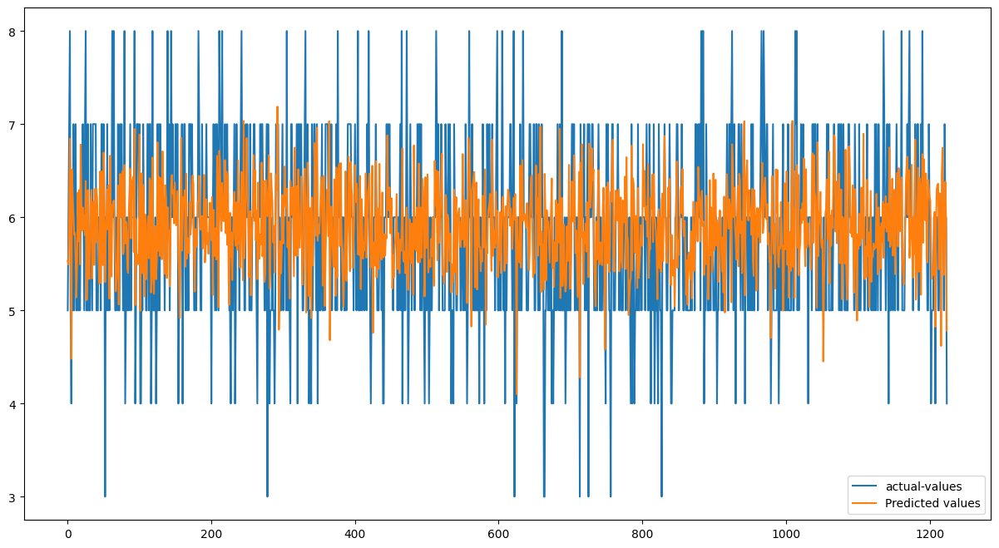

In [25]:
plt.figure(figsize=(15, 8))
plt.plot([i for i in range(len(Y_test))],Y_test, label="actual-values")
plt.plot([i for i in range(len(Y_test))],pred_test_rr, label="Predicted values")
plt.legend()
plt.show()

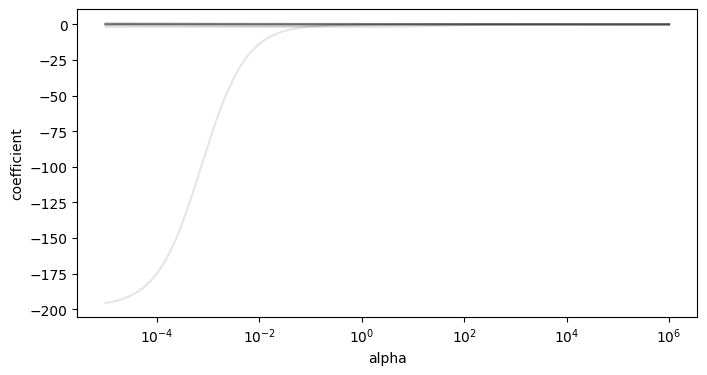

In [26]:
n_alphas = 200
alphas = np.logspace(-5, 6, n_alphas)
plt.figure(figsize=(8, 4))
coefs = []
for a in alphas:
    ridge = Ridge(alpha=a)
    ridge.fit(X_train, Y_train)
    coefs.append(ridge.coef_)

plt.plot(alphas, coefs, c='k', alpha=.1)
plt.xscale("log")
plt.xlabel("alpha")
plt.ylabel("coefficient")
plt.ylim=([-5,5])
plt.show()

Text(0, 0.5, 'R^2')

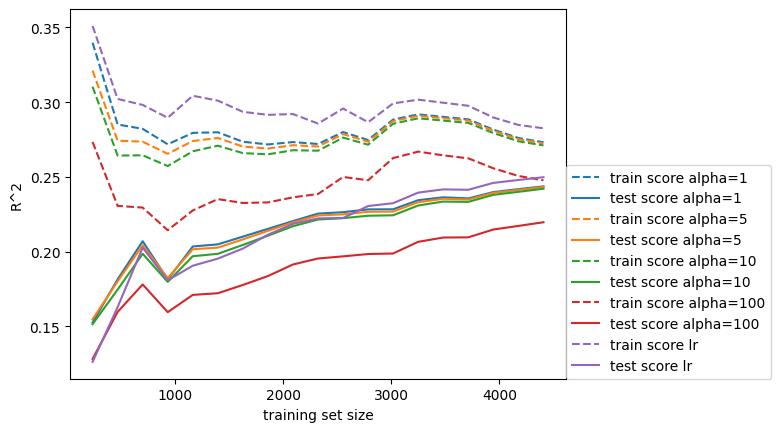

In [27]:
from sklearn.model_selection import learning_curve
def plot_learning_curve(est, name):
    train_set_size, train_scores, test_scores = learning_curve(est, X, y, cv=10, train_sizes=np.linspace(0, 1, 20)[1:])
    test_mean = test_scores.mean(axis=1)
    train_mean = train_scores.mean(axis=1)
    line, = plt.plot(train_set_size, train_mean, linestyle="--", label="train score {}".format(name))
    plt.plot(train_set_size, test_mean, label="test score {}".format(name),
             c=line.get_color())

plot_learning_curve(Ridge(alpha=1), "alpha=1")
plot_learning_curve(Ridge(alpha=5), "alpha=5")
plot_learning_curve(Ridge(alpha=10), "alpha=10")
plot_learning_curve(Ridge(alpha=100), "alpha=100")
plot_learning_curve(LinearRegression(), "lr")
plt.legend(loc=(1, 0))
plt.xlabel("training set size")
plt.ylabel("R^2")

In [28]:
ridge = Ridge()
parameters = {'alpha':[1e-15,1e-10,1e-8,1e-3,1e-2,1e-1,0.1]}
ridge_regressor = GridSearchCV(ridge,parameters)
ridge_regressor.fit(X_train,Y_train)

print("GridSearchCV on training set")
print(ridge_regressor.best_params_)
print(ridge_regressor.best_score_)

GridSearchCV on training set
{'alpha': 1e-08}
0.28304281510221063


MSE 0.7362761607387311
MAE 0.5737023620191282
R^2 Train 0.2916761839983417
R^2 Test 0.24380080160945294


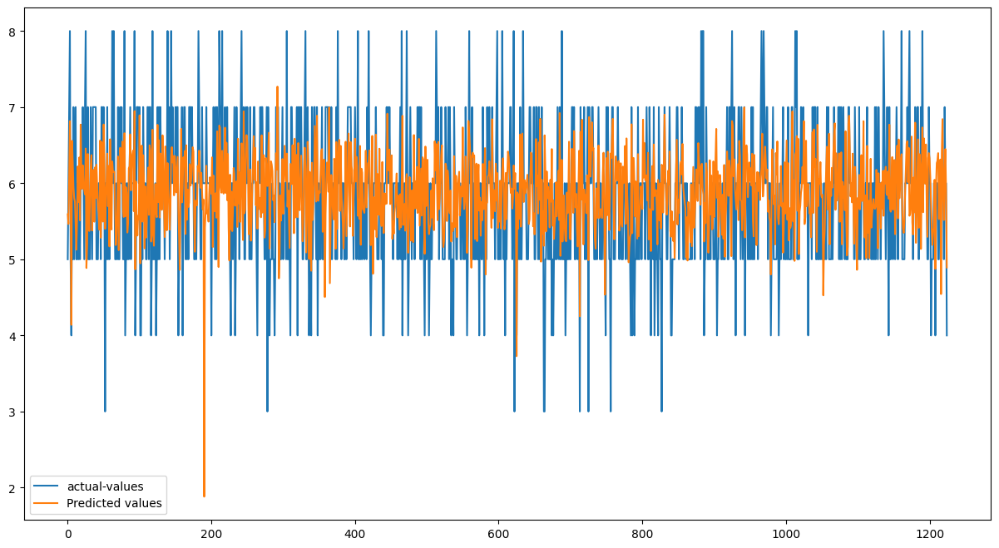

In [49]:
model_ridge1 = Ridge(alpha = 1e-08)
model_ridge1.fit(X_train, Y_train)

pred_train_rrr= model_ridge1.predict(X_train)
pred_test_rrr= model_ridge1.predict(X_test)
print("MSE " + str(np.sqrt(mean_squared_error(Y_train,pred_train_rrr))))
print("MAE " + str(mean_absolute_error(Y_train, pred_train_rrr)))
print("R^2 Train "+ str(r2_score(Y_train, pred_train_rrr)))
print("R^2 Test "+ str(r2_score(Y_test, pred_test_rrr)))

plt.figure(figsize=(15, 8))
plt.plot([i for i in range(len(Y_test))],Y_test, label="actual-values")
plt.plot([i for i in range(len(Y_test))],pred_test_rrr, label="Predicted values")
plt.legend()
plt.show()

**Lasso Regression Red Wine**


In [51]:
from sklearn.linear_model import LassoCV
n_samples, n_features = 10, 5
X = red[["volatile acidity", "fixed acidity", "citric acid",
        "residual sugar", "chlorides", "total sulfur dioxide",
        "free sulfur dioxide" ,"density","pH",
        "sulphates", "alcohol"]]
y = red['quality']
X_train,X_test,Y_train, Y_test = train_test_split(X,y,
                                              random_state = 0)
model_lasso = Lasso(alpha=1.0)
model_lasso.fit(X_train, Y_train)
pred_train_ll= model_lasso.predict(X_train)
pred_test_ll= model_lasso.predict(X_test)
print("MSE " + str(np.sqrt(mean_squared_error(Y_train,pred_train_ll))))
print("MAE " + str(mean_absolute_error(Y_train, pred_train_ll)))
print("R^2 Train "+ str(r2_score(Y_train, pred_train_ll)))
print("R^2 Test "+ str(r2_score(Y_test, pred_test_ll)))

MSE 0.8012917437362195
MAE 0.660646229093192
R^2 Train 0.03468883535504408
R^2 Test 0.02635767137719147


Real and predicted values comparasion

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.540e+02, tolerance: 7.975e-02
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.234e+02, tolerance: 7.975e-02
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.448e+01, tolerance: 7.975e

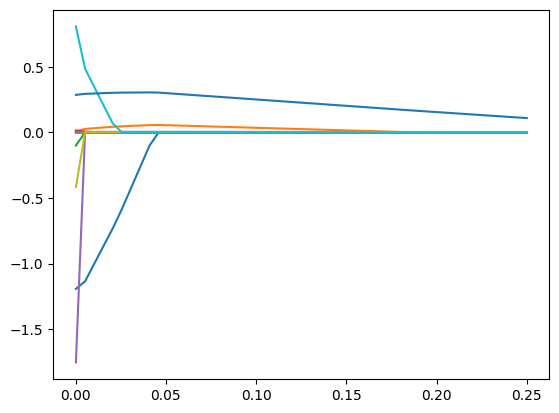

In [54]:
alphas = np.linspace(0.0001,0.25)
lasso = Lasso(max_iter=5)
coefs = []
for a in alphas:
    lasso.set_params(alpha=a)
    lasso.fit(X_train, Y_train)
    coefs.append(lasso.coef_)
ax = plt.gca()
ax.plot(alphas, coefs)

Alpha values comparasion

Text(0, 0.5, 'R^2')

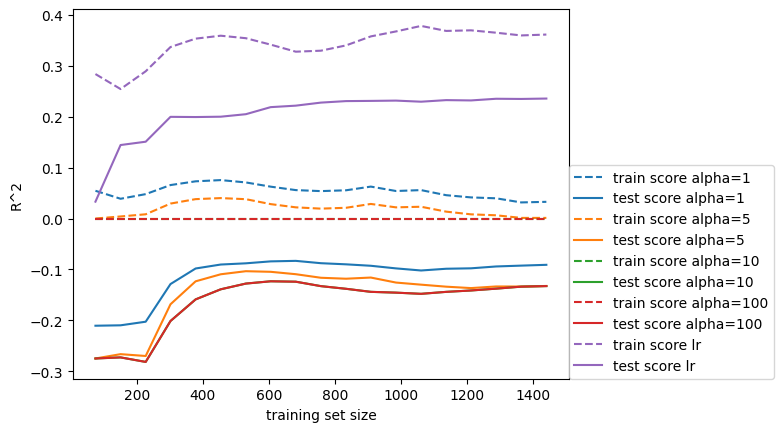

In [55]:
from sklearn.model_selection import learning_curve
def plot_learning_curve(est, name):
    train_set_size, train_scores, test_scores = learning_curve(est, X, y, cv=10, train_sizes=np.linspace(0, 1, 20)[1:])
    test_mean = test_scores.mean(axis=1)
    train_mean = train_scores.mean(axis=1)
    line, = plt.plot(train_set_size, train_mean, linestyle="--", label="train score {}".format(name))
    plt.plot(train_set_size, test_mean, label="test score {}".format(name),
             c=line.get_color())

plot_learning_curve(Lasso(alpha=1), "alpha=1")
plot_learning_curve(Lasso(alpha=5), "alpha=5")
plot_learning_curve(Lasso(alpha=10), "alpha=10")
plot_learning_curve(Lasso(alpha=100), "alpha=100")
plot_learning_curve(LinearRegression(), "lr")
plt.legend(loc=(1, 0))
plt.xlabel("training set size")
plt.ylabel("R^2")

GridSearch CV Lasso

In [56]:
lasso = Lasso()
parameters1 = {'alpha':[1e-15,13-10,1e-8,1e-3,1e-2,1e-1,1,2,5]}
lasso_regressor = GridSearchCV(lasso,parameters1,return_train_score=True)
lasso_regressor.fit(X_train,Y_train)


print("GridSearchCV on training set")
print(str(lasso_regressor.best_params_))
print(lasso_regressor.best_score_)

GridSearchCV on training set
{'alpha': 0.001}
0.33125221003766586


Tunned model lasso

In [58]:
model_lasso1 = Lasso(alpha = 0.001)
model_lasso1.fit(X_train, Y_train)

pred_train_lll= model_lasso1.predict(X_train)
pred_test_lll= model_lasso1.predict(X_test)
print("MSE " + str(np.sqrt(mean_squared_error(Y_train,pred_train_lll))))
print("MAE " + str(mean_absolute_error(Y_train, pred_train_lll)))
print("R^2 Train "+ str(r2_score(Y_train, pred_train_lll)))
print("R^2 Test "+ str(r2_score(Y_test, pred_test_lll)))

MSE 0.6516629587871464
MAE 0.5111104197870922
R^2 Train 0.36154239384352216
R^2 Test 0.343611701583038


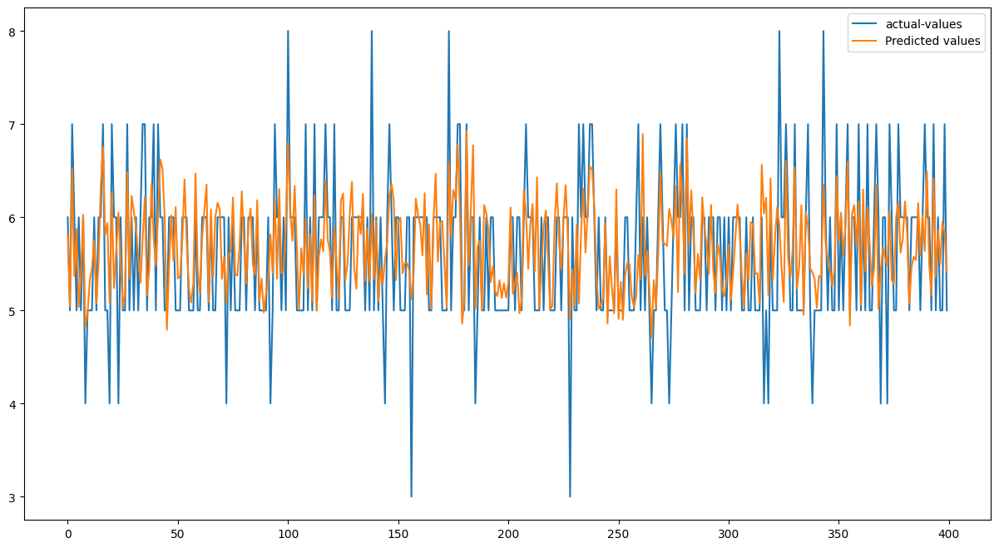

In [59]:
plt.figure(figsize=(15, 8))
plt.plot([i for i in range(len(Y_test))],Y_test, label="actual-values")
plt.plot([i for i in range(len(Y_test))],pred_test_lll, label="Predicted values")
plt.legend()
plt.show()

Scatter plot Lasso

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.964e+02, tolerance: 7.331e-02
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.940e+02, tolerance: 7.230e-02
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.934e+02, tolerance: 7.049e

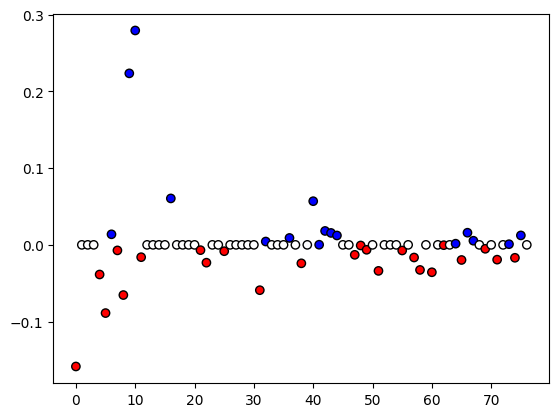

In [60]:
from sklearn.preprocessing import PolynomialFeatures, scale
X_poly = PolynomialFeatures(include_bias=False).fit_transform(scale(X))
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, random_state=0)
param_grid = {'alpha': np.logspace(-3, 0, 14)}
lasso_regressor2 = GridSearchCV(lasso,parameters1, return_train_score=True, cv=10)
lasso_regressor2.fit(X_train,Y_train)
lasso = lasso_regressor2.best_estimator_
plt.scatter(range(X_poly.shape[1]), lasso.coef_, c=np.sign(lasso.coef_), cmap="bwr_r", edgecolor='k')

Mean of train and test sets


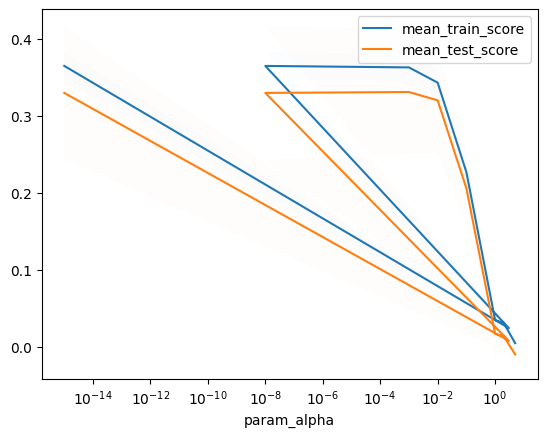

In [64]:
results = pd.DataFrame(lasso_regressor.cv_results_)
results.plot('param_alpha', 'mean_train_score')
results.plot('param_alpha', 'mean_test_score', ax=plt.gca())
plt.fill_between(results.param_alpha.astype(float),
                 results['mean_train_score'] + results['std_train_score'],
                 results['mean_train_score'] - results['std_train_score'], alpha=0.01)
plt.fill_between(results.param_alpha.astype(float),
                 results['mean_test_score'] + results['std_test_score'],
                 results['mean_test_score'] - results['std_test_score'], alpha=0.01)
plt.legend()
plt.xscale("log")

Lasso Regression White

In [67]:
from sklearn.linear_model import LassoCV
n_samples, n_features = 10, 5
X = white[["volatile acidity", "fixed acidity", "citric acid",
        "residual sugar", "chlorides", "total sulfur dioxide",
        "free sulfur dioxide" ,"density","pH",
        "sulphates", "alcohol"]]
y = white['quality']
X_train,X_test,Y_train, Y_test = train_test_split(X,y,
                                              random_state = 0)
model_lasso = Lasso(alpha=1.0)
model_lasso.fit(X_train, Y_train)
pred_train_ll= model_lasso.predict(X_train)
pred_test_ll= model_lasso.predict(X_test)
print("MSE " + str(np.sqrt(mean_squared_error(Y_train,pred_train_ll))))
print("MAE " + str(mean_absolute_error(Y_train, pred_train_ll)))
print("R^2 Train "+ str(r2_score(Y_train, pred_train_ll)))
print("R^2 Test "+ str(r2_score(Y_test, pred_test_ll)))

MSE 0.8539341767327165
MAE 0.6410863929770539
R^2 Train 0.04720568475254583
R^2 Test 0.02961896622669069


Real and predicted values comparasion

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.020e+03, tolerance: 2.811e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.017e+02, tolerance: 2.811e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.611e+01, tolerance: 2.811e

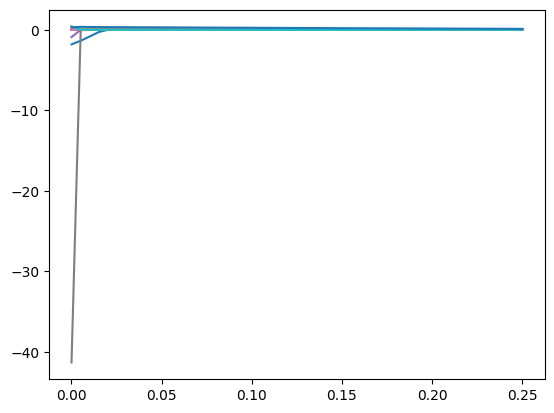

In [69]:
alphas = np.linspace(0.0001,0.25)
lasso = Lasso(max_iter=5)
coefs = []
for a in alphas:
    lasso.set_params(alpha=a)
    lasso.fit(X_train, Y_train)
    coefs.append(lasso.coef_)
ax = plt.gca()
ax.plot(alphas, coefs)

Alpha values comparasion

Text(0, 0.5, 'R^2')

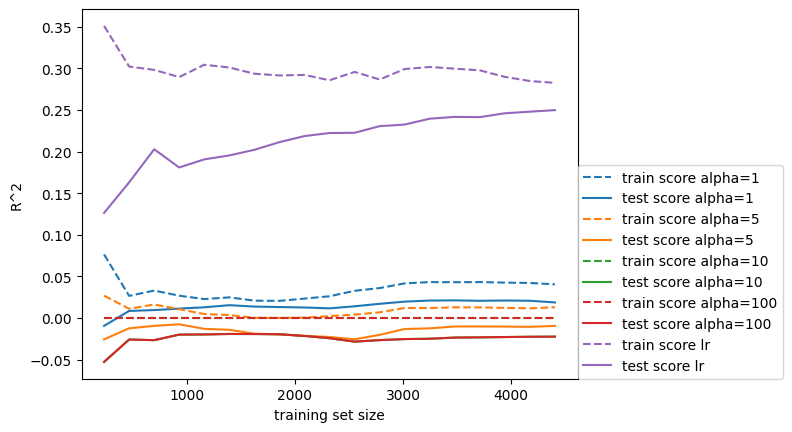

In [70]:
from sklearn.model_selection import learning_curve
def plot_learning_curve(est, name):
    train_set_size, train_scores, test_scores = learning_curve(est, X, y, cv=10, train_sizes=np.linspace(0, 1, 20)[1:])
    test_mean = test_scores.mean(axis=1)
    train_mean = train_scores.mean(axis=1)
    line, = plt.plot(train_set_size, train_mean, linestyle="--", label="train score {}".format(name))
    plt.plot(train_set_size, test_mean, label="test score {}".format(name),
             c=line.get_color())

plot_learning_curve(Lasso(alpha=1), "alpha=1")
plot_learning_curve(Lasso(alpha=5), "alpha=5")
plot_learning_curve(Lasso(alpha=10), "alpha=10")
plot_learning_curve(Lasso(alpha=100), "alpha=100")
plot_learning_curve(LinearRegression(), "lr")
plt.legend(loc=(1, 0))
plt.xlabel("training set size")
plt.ylabel("R^2")

GridSearchCV

In [71]:
lasso = Lasso()
parameters1 = {'alpha':[1e-15,13-10,1e-8,1e-3,1e-2,1e-1,1,2,5]}
lasso_regressor = GridSearchCV(lasso,parameters1,return_train_score=True)
lasso_regressor.fit(X_train,Y_train)


print("GridSearchCV on training set")
print(str(lasso_regressor.best_params_))
print(lasso_regressor.best_score_)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.448e+02, tolerance: 2.237e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.097e+02, tolerance: 2.285e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.433e+02, tolerance: 2.234e

GridSearchCV on training set
{'alpha': 1e-08}
0.28304301944154764


Tunned model

In [72]:
model_lasso1 = Lasso(alpha = 1e-08)
model_lasso1.fit(X_train, Y_train)

pred_train_lll= model_lasso1.predict(X_train)
pred_test_lll= model_lasso1.predict(X_test)
print("MSE " + str(np.sqrt(mean_squared_error(Y_train,pred_train_lll))))
print("MAE " + str(mean_absolute_error(Y_train, pred_train_lll)))
print("R^2 Train "+ str(r2_score(Y_train, pred_train_lll)))
print("R^2 Test "+ str(r2_score(Y_test, pred_test_lll)))

MSE 0.736276161070697
MAE 0.5737019638155196
R^2 Train 0.29167618335961576
R^2 Test 0.24380805245782766


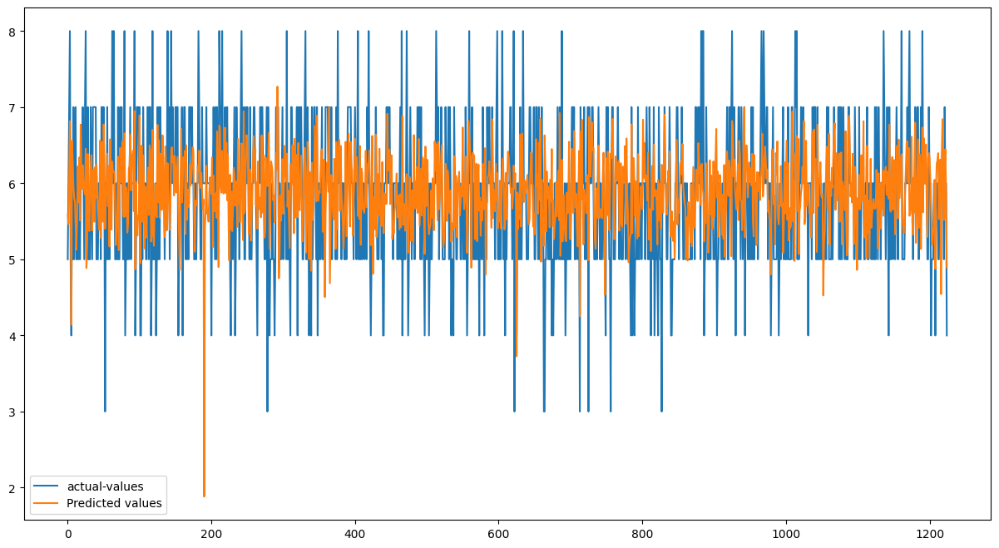

In [73]:
plt.figure(figsize=(15, 8))
plt.plot([i for i in range(len(Y_test))],Y_test, label="actual-values")
plt.plot([i for i in range(len(Y_test))],pred_test_lll, label="Predicted values")
plt.legend()
plt.show()

Scatter plot White Lasso

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.887e+02, tolerance: 2.547e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.828e+02, tolerance: 2.501e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.026e+02, tolerance: 2.556e

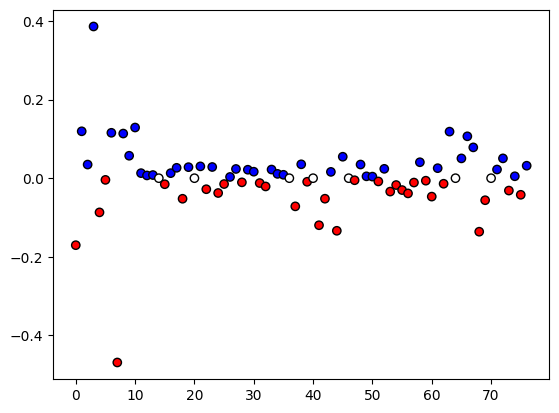

In [74]:
from sklearn.preprocessing import PolynomialFeatures, scale
X_poly = PolynomialFeatures(include_bias=False).fit_transform(scale(X))
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, random_state=0)
param_grid = {'alpha': np.logspace(-3, 0, 14)}
lasso_regressor2 = GridSearchCV(lasso,parameters1, return_train_score=True, cv=10)
lasso_regressor2.fit(X_train,Y_train)
lasso = lasso_regressor2.best_estimator_
plt.scatter(range(X_poly.shape[1]), lasso.coef_, c=np.sign(lasso.coef_), cmap="bwr_r", edgecolor='k')

Mean of train and test sets

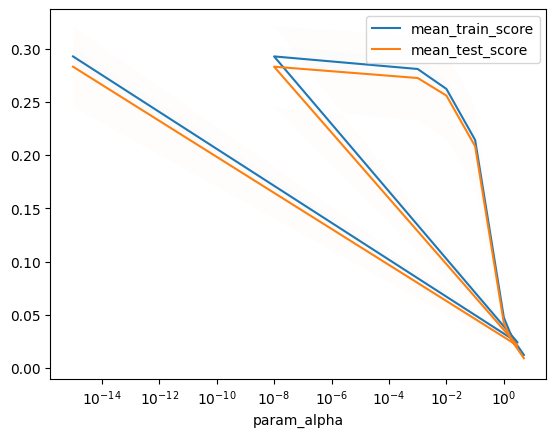

In [75]:
results = pd.DataFrame(lasso_regressor.cv_results_)
results.plot('param_alpha', 'mean_train_score')
results.plot('param_alpha', 'mean_test_score', ax=plt.gca())
plt.fill_between(results.param_alpha.astype(float),
                 results['mean_train_score'] + results['std_train_score'],
                 results['mean_train_score'] - results['std_train_score'], alpha=0.01)
plt.fill_between(results.param_alpha.astype(float),
                 results['mean_test_score'] + results['std_test_score'],
                 results['mean_test_score'] - results['std_test_score'], alpha=0.01)
plt.legend()
plt.xscale("log")

Elastic Regression Model

In [77]:
from sklearn.linear_model import ElasticNet
model_enet = ElasticNet(alpha = 1,l1_ratio=0.5)
model_enet.fit(X, y)
X_train,X_test,Y_train, Y_test = train_test_split(X,y,
                                              random_state = 0)
pred_train_enet= model_enet.predict(X_train)
pred_test_enet= model_enet.predict(X_test)

print(r2_score(Y_train, pred_train_enet))
print(r2_score(Y_test, pred_test_enet))


0.053191618260493456
0.033627778572796974


we checked for necessary of using cross-validation in the ElasticNetCV model. Without implementing cross-validation the MAE is smaller.

In [78]:
from numpy import arange
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import ElasticNetCV

cv = RepeatedKFold(n_splits = 5,n_repeats = 3)


model_e = ElasticNet()
parameters = {'alpha':[1e-15,1e-10,1e-8,1e-3,1e-2,1e-1,1,2,5],'l1_ratio':[0.001,0.01,0.1,0.3,0.6,0.7,1]}
search = GridSearchCV(model_e,param_grid = parameters)
results = search.fit(X,y)
print('MAE: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)


model_e = ElasticNet()
parameters = {'alpha':[1e-15,1e-10,1e-8,1e-3,1e-2,1e-1,1,2,5],'l1_ratio':[0.001,0.01,0.1,0.3,0.6,0.7,1]}
search = GridSearchCV(model_e,param_grid = parameters,cv=cv)
results = search.fit(X,y)
print('MAE: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.044e+03, tolerance: 2.986e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.092e+03, tolerance: 3.020e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.101e+03, tolerance: 3.051e

MAE: 0.246
Config: {'alpha': 1e-08, 'l1_ratio': 0.001}


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.090e+03, tolerance: 3.050e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.099e+03, tolerance: 3.055e-01
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.086e+03, tolerance: 3.051e

MAE: 0.273
Config: {'alpha': 1e-08, 'l1_ratio': 0.001}


In this case we checked values of l1_ratio and alpha and we can say that MAE is better in case of test set data

In [79]:
from sklearn.linear_model import ElasticNetCV

model = ElasticNetCV(l1_ratio = [0,0.1,1],alphas = [1e-15,1e-10,1e-8,1e-3,1e-2,1e-1,1,2,5])
model.fit(X_train,Y_train)
test_predictions = model.predict(X_test)
train_predictions = model.predict(X_train)

MAE = mean_absolute_error(Y_test,test_predictions)
MSE = mean_squared_error(Y_test,test_predictions)
MAE1 = mean_absolute_error(Y_train,train_predictions)
MSE1 = mean_squared_error(Y_train,train_predictions)
R2 = r2_score(Y_train,train_predictions)
print(R2)
print(MAE)
print(MSE)
print(model.coef_)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1010.2141611066861, tolerance: 0.22372270251872
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did 

0.29165330983297466
0.6166429292242064
0.6317550455739548
[-1.81882418e+00  1.08799261e-01 -1.84998870e-02  9.32089122e-02
 -5.49037603e-01 -2.57924993e-04  4.79970728e-03 -1.89074779e+02
  8.48991180e-01  6.14703712e-01  1.42316913e-01]


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.963e+02, tolerance: 2.811e-01 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


Cross validation Kfold

In [83]:
from numpy import mean
from numpy import sqrt
from numpy import absolute
from numpy import std
X = red[["volatile acidity", "fixed acidity", "citric acid",
        "residual sugar", "chlorides", "total sulfur dioxide",
        "free sulfur dioxide" ,"density","pH",
        "sulphates", "alcohol"]]
y = red['quality']

cv = KFold(n_splits=5,shuffle= True)
model = LinearRegression()

scores = cross_val_score(model,X,y)
print('Accuracy: %.3f (%.3f)' % (mean(scores), std(scores)))

Accuracy: 0.290 (0.084)


In [84]:
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
ratios = arange(0, 1, 0.01)
alphas = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 0.0, 1.0, 10.0, 100.0]
model = ElasticNetCV(l1_ratio=ratios, alphas=alphas, cv=cv, n_jobs=-1)
model.fit(X, y)
print('alpha: %f' %model.alpha_)
print('l1_ratio_: %f' %model.l1_ratio_)

Die letzten 5000 Zeilen der Streamingausgabe wurden abgeschnitten.
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 296.6808816311353, tolerance: 0.09262654621264764
  model = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.10/dist-packages/sklearn/linear

alpha: 0.000100
l1_ratio_: 0.000000


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.338e+02, tolerance: 1.042e-01 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


In [86]:
X = red[["volatile acidity", "fixed acidity", "citric acid",
        "residual sugar", "chlorides", "total sulfur dioxide",
        "free sulfur dioxide" ,"density","pH",
        "sulphates", "alcohol"]]
y = red['quality']

model = ElasticNet()
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)

grid = dict()
grid['alpha'] = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 0.0, 1.0, 10.0, 100.0]
grid['l1_ratio'] = arange(0, 1, 0.01)

search = GridSearchCV(model, grid, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)

results = search.fit(X, y)

print('MAE: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

MAE: -0.505
Config: {'alpha': 0.0001, 'l1_ratio': 0.0}


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.338e+02, tolerance: 1.042e-01 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
